<a href="https://colab.research.google.com/github/silviaaax/datastories_for_emme/blob/main/Homework8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import time
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import spacy

In [ ]:
!python -m spacy download el_core_news_sm

In [4]:
start_page = 1
end_page = 4
start_url = 'https://www.news247.gr/koinonia/?pages='
main_url = 'https://www.news247.gr/'

test_url = start_url + str(start_page)

In [5]:
response = requests.get(test_url)
doc = BeautifulSoup(response.text, 'html.parser')

In [6]:
teaser_articles_list = doc.find('div', {'class': 'teaser__content'}).find_all('article')

In [ ]:
teaser_articles_list[0]

In [ ]:
print(teaser_articles_list[0].prettify())

In [ ]:
link = teaser_articles_list[0].find('a', {'': ''})['href']
print(link)

In [10]:
teasers_list = []

for page_num in range(start_page, end_page + 1):
    page_url = start_url + str(page_num)
    response = requests.get(page_url)
    doc = BeautifulSoup(response.text, 'html.parser')

    article_elements = doc.find_all('article')

    for article in article_elements:
        story_dict = {}
        try:
            link = article.find('a')['href']
            if link.startswith("http"):
                story_dict['url'] = link
            else:
                story_dict['url'] = main_url + link
        except:
            story_dict['url'] = ''
            pass

        teasers_list.append(story_dict)

    time.sleep(1)


In [ ]:
news247_teasers_df = pd.DataFrame(teasers_list)
news247_teasers_df

In [12]:
news247_teasers_df.to_csv('/content/drive/MyDrive/Colab Notebooks/lolzzz.csv', index=False)

In [13]:
article_url = 'https://www.news247.gr/koinonia/kolonos-ston-anakriti-oi-4-katigoroymenoi-gia-tin-ypothesi-viasmoy-tis-12chronis.10094723.html'

In [14]:
response = requests.get(article_url)
doc = BeautifulSoup(response.text, 'html.parser')

In [15]:
article = doc.find('div', {'class': 'article-body'})

In [ ]:
section = doc.find('div', {'class': 'article-head'}).text
section

In [ ]:
title = article.find('h1').text
title

In [ ]:
date = article.find('time')['datetime']
date

In [ ]:
author = article.find('span', {'class', "article-body__credit"}).text
author

In [ ]:
paragraphs = article.find_all('p')
paragraphs

In [ ]:
p_texts_list = []
paragraphs = article.find_all('p')
for p in paragraphs:
  p_texts_list.append(p.text)
full_text = ' '.join(p_texts_list)
full_text = "".join(full_text.splitlines())
full_text

In [ ]:
news247_teasers_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/lolzzz.csv')
news247_teasers_df.head()

In [29]:
full_articles_list = []


for article_url in news247_teasers_df['url']:
  response = requests.get(article_url)
  doc = BeautifulSoup(response.text, 'html.parser')


  article = doc.find('div', {'class': 'article-body'})


  full_article_dict = {}


  # website
  full_article_dict['site'] = "news247.gr"


  # url
  full_article_dict['url'] = article_url


  #section
  try:
    section = doc.find('div', {'class': 'article-head'}).text
    full_article_dict['section'] = section
  except:
    full_article_dict['section'] = ''
    pass


  #title
  try:
    title = title = article.find('h1').text
    full_article_dict['title'] = title
  except:
    full_article_dict['title'] = ''
    pass


  # date
  try:
    date = article.find('time')['datetime']
    full_article_dict['date'] = date
  except:
    full_article_dict['date'] = ''
    pass


  # author
  try:
    author = article.find('div', {'class', "article-body__author-name"}).text
    full_article_dict['author'] = author
  except:
    full_article_dict['author'] = ''
    pass
      #o author me paidepse paara polu kai en telh vrhka thn lush se ena palio sas solution gia to news247 pou eixate anevasmeno sto github opote thank youuu!
      #profanws kai den epeleksa giauto to news247 to vrhka twra psaxnontas gia mia lush gia ton author:)


  # full_text
  try:
    p_texts_list = []
    paragraphs = article.find_all('p')
    for p in paragraphs:
      p_texts_list.append(p.text)
    full_text = ' '.join(p_texts_list)
    full_text = "".join(full_text.splitlines())
    full_article_dict['full_text'] = full_text
  except:
    full_article_dict['full_text'] = ''
    pass


  full_articles_list.append(full_article_dict)
  time.sleep(1)

In [30]:
news247_df = pd.DataFrame(full_articles_list)
news247_df = news247_df.replace(r'\r+|\n+|\t+','', regex=True)
news247_df

,site,url,section,title,date,author,full_text
0,news247.gr,https://www.news247.gr/koinonia/larisa-ti-prag...,ΚΟΙΝΩΝΙΑ,Λάρισα: Τι πραγματικά συνέβη με τις δύο αμαξοσ...,2023-06-28 22:12,Κωνσταντίνος Χασανδρινός,"Η εικόνα που είδε το φως της δημοσιότητας, το ..."
1,news247.gr,https://www.news247.gr/koinonia/telesigrafo-ti...,ΚΟΙΝΩΝΙΑ,Τελεσίγραφο της Frontex στην Ελλάδα: Συνεργαστ...,2023-06-28 18:40,Νίκος Γιαννόπουλος,Iδιαίτερα δύσκολη είναι η θέση της χώρας αναφο...
2,news247.gr,https://www.news247.gr/koinonia/zakynthos-nea-...,ΚΟΙΝΩΝΙΑ,Ζάκυνθος: Συνελήφθη άνδρας για κακοποίηση σκύλ...,2023-06-28 20:48,,"Νέο περιστατικό κακοποίησης ζώου, μέσα σε μόλι..."
3,news247.gr,https://www.news247.gr/koinonia/gynaikoktonia-...,ΚΟΙΝΩΝΙΑ,Γυναικοκτονία στην Κω: Στον Κορυδαλλό μεταφέρε...,2023-06-28 23:27,,Στις φυλακές Κορυδαλλού αναμένεται να μεταφερθ...
4,news247.gr,https://www.news247.gr/koinonia/larisa-ti-prag...,ΚΟΙΝΩΝΙΑ,Λάρισα: Τι πραγματικά συνέβη με τις δύο αμαξοσ...,2023-06-28 22:12,Κωνσταντίνος Χασανδρινός,"Η εικόνα που είδε το φως της δημοσιότητας, το ..."
...,...,...,...,...,...,...,...
167,news247.gr,https://www.news247.gr/sunday-edition/gia-ekei...,SUNDAY EDITION,Για εκείνους που θα λείπουν και φέτος από τις ...,2023-06-24 09:19,Μαριλένα Κουντούρη,Οι εκλογές είναι όντως η γιορτή της δημοκρατία...
168,news247.gr,https://www.news247.gr/koinonia/omofoviki-epit...,ΚΟΙΝΩΝΙΑ,"Ομοφοβική επίθεση σε λεωφορείο του ΟΑΣΘ - ""Με ...",2023-06-24 08:59,,Σε μια σοκαριστική καταγγελία για ομοτρανσφοβι...
169,news247.gr,https://www.news247.gr/koinonia/chalkidiki-ant...,ΚΟΙΝΩΝΙΑ,Χαλκιδική: Άντρας βρέθηκε νεκρός μέσα στο σκάφ...,2023-06-24 08:55,,Νεκρός βρέθηκε μέσα στο σκάφος του ένας άντρας...
170,news247.gr,https://www.news247.gr/koinonia/eglima/gynaiko...,ΕΓΚΛΗΜΑ,Γυναικοκτονία στην Κω: Ο δολοφόνος της Αναστάζ...,2023-06-24 08:23,,Συγκλονισμένο εξακολουθεί να παρακολουθεί το π...


In [73]:
news247_df.to_csv('/content/drive/MyDrive/Colab Notebooks/news247_df_full.csv', index=False)

In [ ]:
news247_df.loc[0, 'full_text']

In [ ]:
news247_df.loc[0, 'date']

In [ ]:
news247_df['datetime'] = pd.to_datetime(news247_df['date'], format='%Y-%m-%d %H:%M')
news247_df.head()

In [77]:
news247_df1 = news247_df['date']

In [ ]:
news247_df1['year'] = pd.DatetimeIndex(news247_df['date']).year
news247_df1['month'] = pd.DatetimeIndex(news247_df['date']).month
news247_df1['day'] = pd.DatetimeIndex(news247_df['date']).day
news247_df1['hour'] = pd.DatetimeIndex(news247_df['date']).hour

<Axes: >

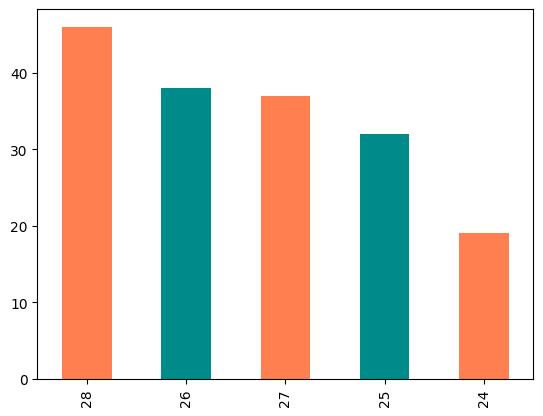

In [123]:
news247_df1['day'].value_counts().plot(kind='bar' , color=['coral' , 'darkcyan'])

<Axes: >

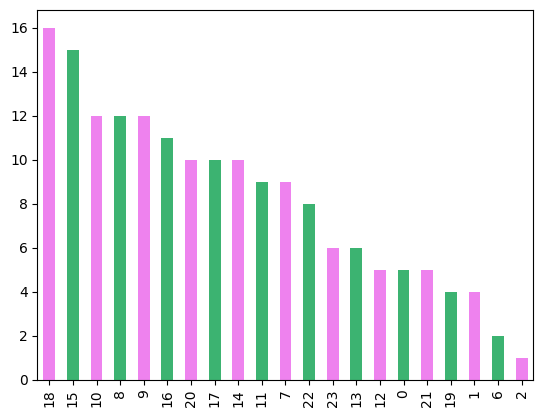

In [120]:
news247_df1['hour'].value_counts().plot(kind='bar' , color=['violet' , 'mediumseagreen'])

In [81]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
list(nlp.Defaults.stop_words) [0:100]

In [83]:
#prospathisa na ftiaksw mia loopa gia ta wordclouds alla den petuxe

WORDCLOUD DAY 1

In [87]:
day1 = pd.to_datetime('2023-06-24')
neo_df = news247_df[news247_df['datetime'].dt.date == day1.date()]

In [89]:
text = ' '.join(neo_df['full_text'].tolist())

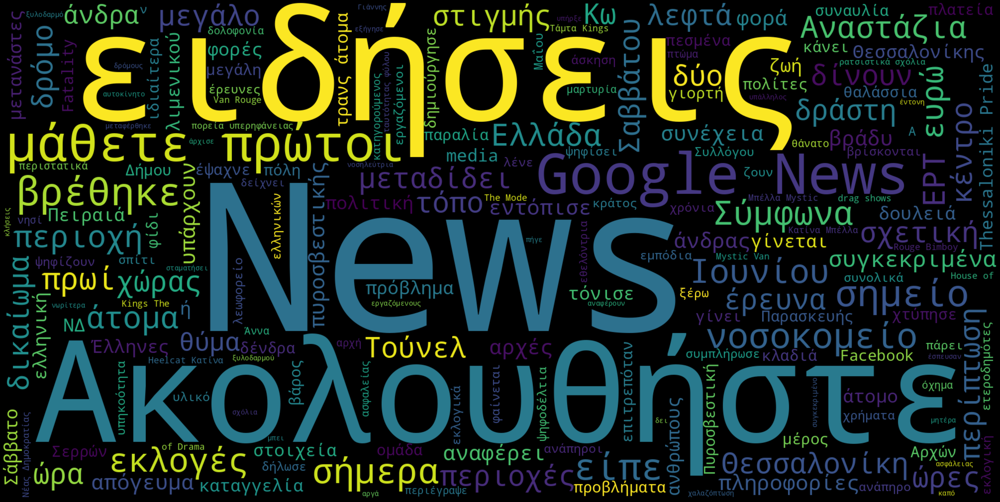

In [91]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

WORDCLOUD DAY 2

In [92]:
day2 = pd.to_datetime('2023-06-25')
neo_df1 = news247_df[news247_df['datetime'].dt.date == day1.date()]

In [93]:
text1 = ' '.join(neo_df['full_text'].tolist())

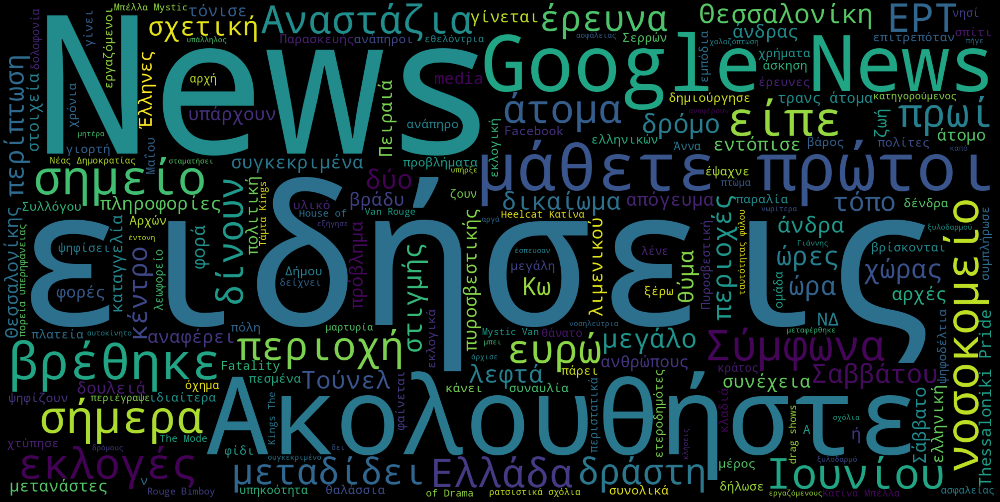

In [106]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text1)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

WORDCLOUD DAY 3

In [96]:
day3 = pd.to_datetime('2023-06-26')
neo_df2 = news247_df[news247_df['datetime'].dt.date == day1.date()]

In [97]:
text2 = ' '.join(neo_df['full_text'].tolist())

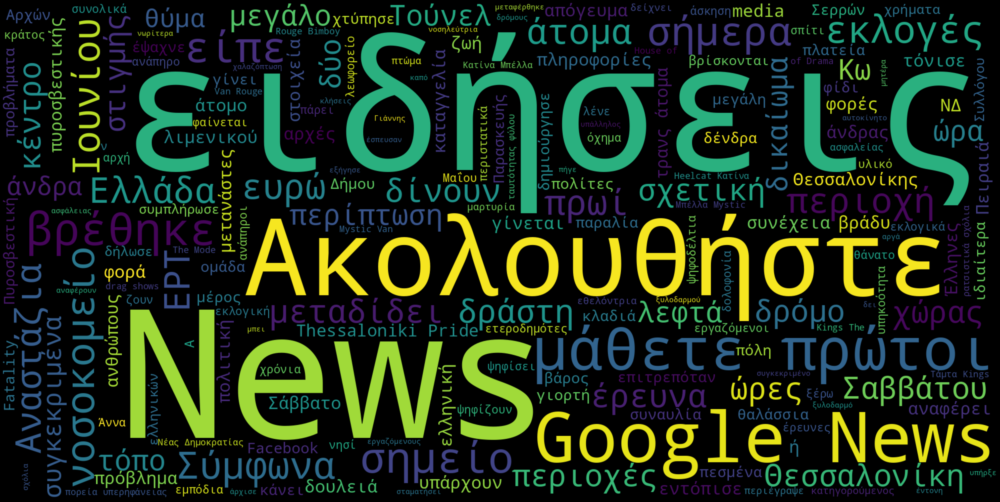

In [98]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text2)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

WORDCLOUD DAY 4

In [99]:
day4 = pd.to_datetime('2023-06-27')
neo_df3 = news247_df[news247_df['datetime'].dt.date == day1.date()]

In [100]:
text3 = ' '.join(neo_df['full_text'].tolist())

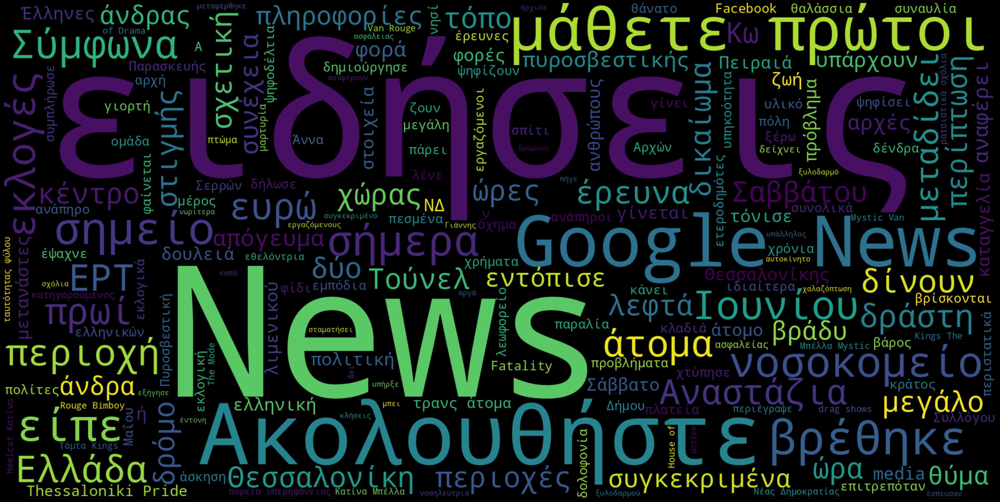

In [101]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text3)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

WORDCLOUD DAY 5

In [102]:
day5 = pd.to_datetime('2023-06-28')
neo_df4 = news247_df[news247_df['datetime'].dt.date == day1.date()]

In [103]:
text4 = ' '.join(neo_df['full_text'].tolist())

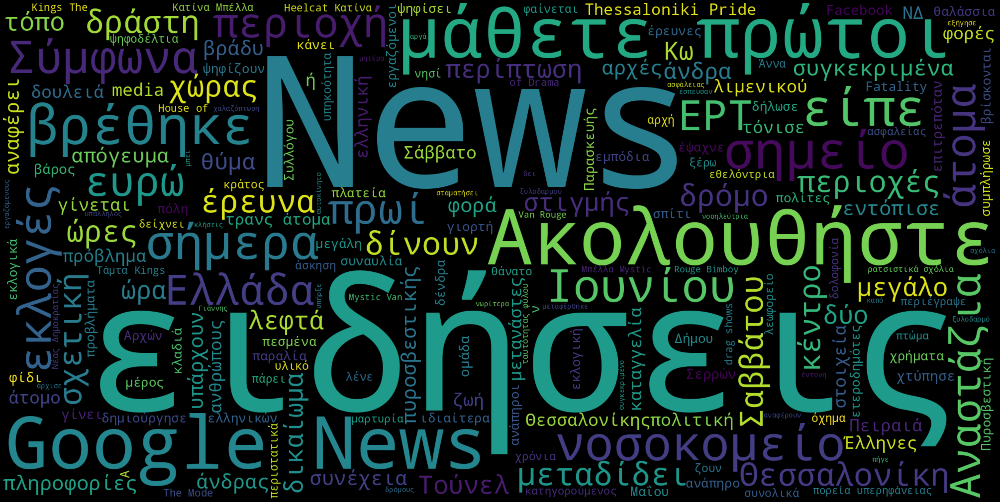

In [107]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text4)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
wordcloud.to_file('/content/drive/MyDrive/Colab Notebooks/news247_wc24-28July.png')

Σύμφωνα με τα παραπάνω συννεφόλεξα στην ειδησεογραφική ιστοσελίδα news247 μεταξύ 24 και 28 Ιουλίου, συγκεκριμένα στον τομέα της κοινωνίας, κυρίαρχη είδηση σε όλες τις ημέρες αποτελεί αυτή της δολοφονίας της Αναστάζια, με τις συχνότερες ,σε χρήση, λέξεις όπως Κω, Αναστάζια, βρέθηκε(γενική λέξη) , πτώμα  και θύμα. Να σημειωθεί πως κυρίαρχες λέξεις είναι και το Τούνελ αλλα και η έρευνα, υποθέτω ότι αφορά και συνδέεται με την συγκεκριμένη είδηση καθώς το Φως στο Τούνελ ασχολείται έντονα με την έρευνα της δολοφονίας.
Δεύετρη σημαντικότερη είδηση είναι οι εκλογές κάτι που προκύπτει απο τις έντονες λέξεις Εκλογών, Ιουνίου , ψηφοδέλτια , ψηφίσει, ΝΔ και Κυριάκος Μητσοτάκης
Μικρότερη χρήση αλλα εξίσου παρατηρήσιμη είναι η λέξη Θεσσαλονική που εμφανίζεται έντονα στα συννεφόλεξα όλων των ημέρων και πιθανόν αφορά διάφορα περιστατικά, αλλα υποθέτω οτι το σημαντικότερο είναι το pride της Θεσσαλονίκης κάθως παρατηρούνται και οι λέξεις pride , pride Thessalonikis , τρανς , τρανς άτομα , Heelcat, Κατίνα Μπέλλα, Mystic Van Rouge, και Fatality
Λέξεις όπως το νοσοκομείο που παρατηρούνται έντονα κάθε μέρα και πιθανόν να πρόκειται για διάφορα περιστατικά.
Τέλος, να σημειωθεί ότι οι λέξεις Ακολουθήστε , Google News, News και Ειδήσεις είναι φυσικά αυτες με την συχνότερη εμφάνιση τους στα άρθρα αλλα δεν υποδεικνύουν κάποιο σημαντικό εύρημα.
